In [56]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [57]:
import scanpy as sc
import torch
import scarches as sca
from scarches.dataset.trvae.data_handling import remove_sparsity
import matplotlib.pyplot as plt
import numpy as np
import gdown

 captum (see https://github.com/pytorch/captum).


In [58]:
import pandas as pd

In [59]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [10]:
def reintegrate_subset(adata, n_hgv=2000, n_layers=3):
    adata_hvg = adata.copy()

    sc.pp.highly_variable_genes(
        adata_hvg, 
        flavor="seurat_v3", 
        n_top_genes=n_hgv, 
        layer="counts", 
        batch_key="dataset_id",
        subset=True
    )

    scvi.model.SCVI.setup_anndata(adata_hvg, layer="counts", batch_key="donor_id")

    vae = scvi.model.SCVI(adata_hvg, n_layers=n_layers, n_latent=30, gene_likelihood="nb")

    vae.train()

    adata_hvg.obsm["X_scVI"] = vae.get_latent_representation()
    
    print("KNN, UMAP, clustering ...")

    sc.pp.neighbors(adata_hvg, n_pcs=30, n_neighbors=20, use_rep="X_scVI", key_added="scvi_neighbors")

    sc.tl.umap(adata_hvg, min_dist=0.5, neighbors_key="scvi_neighbors", spread =1)

    sc.tl.leiden(adata_hvg, resolution=1, key_added="leiden", neighbors_key="scvi_neighbors")

    sc.set_figure_params(figsize=(8,8))

    print("Plot UMAP of with highly variable genes...") 
    sc.set_figure_params(figsize=(8,8))
    
    sc.pl.umap(
        adata_hvg,
        color=["dataset_id", "leiden"],
        frameon=False,
        size=5,
        ncols=1
    )


    #save umap
    adata.obsm["X_umap"] = adata_hvg.obsm["X_umap"]
    #save scvi model
    adata.obsm["X_scVI"] = vae.get_latent_representation()
    #save clusters
    adata.obs[["leiden"]] = adata_hvg.obs[["leiden"]]
    #Compute KNN
    sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20, use_rep="X_scVI", key_added="scvi_neighbors")

    print("Plot UMAP of the full adata...")

    sc.pl.umap(
        adata,
        color=["leiden", "predictions"],
        frameon=False,
        size=5,
        ncols=1
    )
    

    return adata
    

In [11]:
def cross_table(
    adata,
    x,
    y,
    normalise=None,
    exclude_x=None,
    exclude_y=None,
    subset=None,
    sort=False,
    include_nan=False,
):
    """Make a cross table comparing two categorical annotations"""
    x_attr = adata.obs[x]
    y_attr = adata.obs[y]
    assert not _is_numeric(x_attr.values), f"Can not operate on numerical {x}"
    assert not _is_numeric(y_attr.values), f"Can not operate on numerical {y}"
    if include_nan:
        x_attr = x_attr.astype(str).astype("category")
        y_attr = y_attr.astype(str).astype("category")
    if subset is not None:
        x_attr = x_attr[subset]
        y_attr = y_attr[subset]
    selection = np.ones(x_attr.size, dtype=bool)
    if exclude_x:
        selection = selection & ~x_attr.isin(exclude_x)
    if exclude_y:
        selection = selection & ~y_attr.isin(exclude_y)
    x_attr = x_attr[selection]
    y_attr = y_attr[selection]

    if normalise in (0, "x", "xy", "row", "index"):
        norm_method = "index"
    elif normalise in (1, "y", "yx", "col", "columns"):
        norm_method = "columns"
    else:
        norm_method = False
    crs_tbl = pd.crosstab(x_attr, y_attr, dropna=False, normalize=norm_method)
    nx, ny = crs_tbl.shape
    if normalise in ("xy", "yx", "jaccard"):
        x_sizes = crs_tbl.sum(axis=1).values
        y_sizes = crs_tbl.sum(axis=0).values
        if normalise == "yx":
            normaliser = np.tile(x_sizes.reshape(nx, 1), (1, ny))
        elif normalise == "xy":
            normaliser = np.tile(y_sizes.reshape(1, ny), (nx, 1))
        else:
            normaliser = (
                np.tile(x_sizes.reshape(nx, 1), (1, ny))
                + np.tile(y_sizes.reshape(1, ny), (nx, 1))
                - crs_tbl.values
            )
        crs_tbl = (crs_tbl / normaliser).round(4)
    if sort in ("x", "index", "xy", "yx", "both"):
        crs_tbl = crs_tbl.sort_index()
    if sort in ("y", "columns", "xy", "yx", "both"):
        crs_tbl = crs_tbl.sort_columns()
    return crs_tbl

In [12]:
haniffaAd = sc.read_h5ad('haniffalab.h5ad')

In [16]:
haniffaAd.obs.columns

Index(['Status', 'Site', 'Tissue', 'Enrichment', 'Location', 'donor_id', 'Sex',
       'Age', 'stage', 'final_clustering'],
      dtype='object')

In [17]:
haniffaAd.obs["final_clustering"].value_counts()

nan                       88368
Differentiated_KC         62258
Th                        56000
Proliferating_KC          32550
VE2                       29738
F2                        28159
Undifferentiated_KC*      21726
Differentiated_KC*        20420
F1                        18747
Tc                        16090
VE1                       14719
F3                        13638
Pericyte_1_non_inflamm    13410
Treg                      13170
Inf_mono                   8401
Melanocyte                 8231
moDC_1                     7698
Macro_1                    7396
Mono                       7226
LC_3                       6328
LC_4                       5930
moDC_2                     5549
Pericyte_2_inflamm         5391
DC2                        5348
LE2                        5151
LC_2                       4965
MigDC                      4592
VE3                        4120
ILC1_3                     3940
moDC_3                     3835
ILC1_NK                    3342
Macro_2 

In [36]:
removed_cells = ['Differentiated_KC', 'Proliferating_KC', 'VE2', 'F2', 'Undifferentiated_KC*',
                                                           'Differentiated_KC*', 'F1', 'VE1', 'F3', 'Pericyte_1_non_inflamm', 'Melanocyte',
                                                           'LC_3', 'LC_4', 'VE3', 'LE1', 'LC_1', 'Schwann1', 'Schwann2']

In [37]:
removed_cells

['Differentiated_KC',
 'Proliferating_KC',
 'VE2',
 'F2',
 'Undifferentiated_KC*',
 'Differentiated_KC*',
 'F1',
 'VE1',
 'F3',
 'Pericyte_1_non_inflamm',
 'Melanocyte',
 'LC_3',
 'LC_4',
 'VE3',
 'LE1',
 'LC_1',
 'Schwann1',
 'Schwann2']

In [38]:
haniffaAd = haniffaAd[~haniffaAd.obs.final_clustering.isin(removed_cells)]

In [40]:
haniffaAd.var = haniffaAd.var[['gene_ids-SKN8090524', 'feature_types-SKN8090524']]

In [48]:
haniffaAd.obs["tissue"] = haniffaAd.obs.Tissue

In [50]:
haniffaAd.obs.columns = ['disease_status', 'Site', 'tissue_harmo', 'Enrichment', 'Location', 
                         'donor_id', 'sex', 'age', 'development_stage', 'cell_type', 'tissue']

In [42]:
adata = sc.read_h5ad('Myeloid_B_T_From_Tissue_label_transfert_Subset_annotated_Milo_3K.h5ad')

In [45]:
adata.obs.columns

Index(['tissue', 'disease', 'donor_id', 'dataset_id', 'sex',
       'development_stage', 'batch', 'majority_voting', 'conf_score',
       '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes',
       'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id',
       'Site', 'Enrichment', 'Location', 'full_clustering',
       'log1p_total_counts', 'Cell_type_scANVI', 'disease_short',
       'nhood_kth_distance', 'tissue_harmo', 'disease_short_2', 'tissue_short',
       'disease_tissue', 'cell_type2', 'majority_voting_2', 'leiden_2',
       'leiden_3', 'relabeled_cells_2', 'relabeled_cells_3'],
      dtype='object')

In [51]:
obs = pd.read_csv("Obs_Myeloid_B_T_From_PBMC_label_transfert_Subset_annotated_Milo_3K_with_UMAP_from_gpu.csv",
                 index_col=0)

/var/tmp/ipykernel_638038/1345156795.py:1: DtypeWarning: Columns (5,6,11,13,14,16,18,19,25,28,29,30,31,32,35,36,40,47,49,51) have mixed types. Specify dtype option on import or set low_memory=False.
  obs = pd.read_csv("Obs_Myeloid_B_T_From_PBMC_label_transfert_Subset_annotated_Milo_3K_with_UMAP_from_gpu.csv",


In [52]:
obs.predictions.value_counts()

Tem/Trm cytotoxic              28339
Trm cytotoxic                  25697
Naive B cells                  23227
Th17                           20589
Tem/Eff helper T               19350
Th1                            17014
T regs                         16338
Memory B cells                 13977
T follicular helper            13388
Mac NUPR1_TREM2_hi             12585
Tcm/Naive helper T             12369
DC2                            11576
Plasma cells2                  10688
Plasma cells3                  10569
γδ T cells                      8704
Mac1                            7629
Mac MERTK_hi_TREM2_low          7104
NK_CD56bright                   6751
Trm_gut                         6733
Proliferative GC B cells        6663
MAIT cell                       6151
Plasma cells1                   5798
Tcm/Naive cytotoxic T cells     5207
Mac2                            5182
GC B cells1                     4975
Th1/Th17_gut                    4621
Intermediate macrophage         4611
M

In [53]:
ref_path = 'ref_model_tissue/'

## Surgery with the query dataset

In [68]:
var_names = pd.read_csv("ref_model_tissue/var_names.csv", index_col=0)

In [70]:
var_names.Genes

0           HES4
1          ISG15
2         TTLL10
3       TNFRSF18
4        TNFRSF4
          ...   
1995      MT-CO1
1996     MT-ATP6
1997      MT-CO3
1998      MT-ND3
1999      MT-CYB
Name: Genes, Length: 2000, dtype: object

In [54]:
adata_query = haniffaAd.copy()

In [71]:
adata_query = adata_query[:, var_names.Genes]

KeyError: "Values ['AC092580.4', 'C5orf56', 'WT1-AS', 'CLLU1'], from ['HES4', 'ISG15', 'TTLL10', 'TNFRSF18', 'TNFRSF4', 'GABRD', 'PLCH2', 'TNFRSF25', 'UTS2', 'TNFRSF9', 'ERRFI1', 'RBP7', 'DRAXIN', 'TNFRSF1B', 'CTRC', 'NBL1', 'PLA2G2A', 'PLA2G2D', 'CAMK2N1', 'CDA', 'C1QA', 'C1QC', 'C1QB', 'LUZP1', 'ID3', 'MDS2', 'FUCA1', 'RCAN3', 'RUNX3', 'RHD', 'LDLRAP1', 'STMN1', 'EXTL1', 'CD52', 'ZNF683', 'HMGN2', 'FGR', 'IFI6', 'SDC3', 'DCDC2B', 'MARCKSL1', 'TSSK3', 'CSMD2', 'GJA4', 'HPCAL4', 'GUCA2B', 'CDC20', 'KDM4A-AS1', 'KLF17', 'PLK3', 'PTCH2', 'TACSTD2', 'JUN', 'NFIA', 'PDE4B', 'TCTEX1D1', 'IL23R', 'IL12RB2', 'GADD45A', 'DIRAS3', 'ZRANB2-AS1', 'ST6GALNAC3', 'DNAJB4', 'IFI44L', 'IFI44', 'WDR63', 'ODF2L', 'CLCA4', 'GBP1', 'GBP2', 'GBP4', 'GBP5', 'TGFBR3', 'BRDT', 'BTBD8', 'GLMN', 'RPAP2', 'GFI1', 'ARHGAP29', 'F3', 'PALMD', 'CDC14A', 'VCAM1', 'S1PR1', 'RNPC3', 'KIAA1324', 'GSTM3', 'CSF1', 'CHI3L2', 'C1orf162', 'KCND3', 'PTPN22', 'TSPAN2', 'MAB21L3', 'CD2', 'REG4', 'CD160', 'ANKRD35', 'TXNIP', 'SV2A', 'OTUD7B', 'C1orf54', 'CTSS', 'CTSK', 'C1orf56', 'CDC42SE1', 'GABPB2', 'RORC', 'S100A10', 'S100A11', 'TCHH', 'S100A9', 'S100A12', 'S100A8', 'S100A6', 'S100A4', 'RPS27', 'ATP8B2', 'PBXIP1', 'DCST1', 'LMNA', 'BGLAP', 'SH2D2A', 'NTRK1', 'FCRL4', 'FCRL3', 'FCRL2', 'FCRL1', 'CD1C', 'CD1B', 'CD1E', 'MNDA', 'PYHIN1', 'FCER1A', 'FCRL6', 'ATP1A2', 'SLAMF6', 'CD84', 'SLAMF1', 'LY9', 'CD244', 'ITLN2', 'FCER1G', 'FCGR2A', 'HSPA6', 'FCGR3A', 'FCGR3B', 'FCGR2B', 'FCRLA', 'SH2D1B', 'RGS5', 'PBX1', 'CD247', 'XCL2', 'XCL1', 'DPT', 'F5', 'SELP', 'SELL', 'SELE', 'METTL18', 'PRRX1', 'FASLG', 'TNFSF4', 'ZBTB37', 'C1orf220', 'RALGPS2', 'ABL2', 'IER5', 'GLUL', 'RGSL1', 'RGS16', 'COLGALT2', 'C1orf21', 'IVNS1ABP', 'PRG4', 'PTGS2', 'RGS1', 'RGS13', 'RGS2', 'B3GALT2', 'CFH', 'ASPM', 'NR5A2', 'ZNF281', 'KIF21B', 'LAD1', 'ELF3', 'PTPN7', 'LGR6', 'CHI3L1', 'BTG2', 'PRELP', 'ATP2B4', 'LAX1', 'KISS1', 'IL10', 'IL24', 'CR2', 'G0S2', 'SERTAD4-AS1', 'SLC30A1', 'ATF3', 'CENPF', 'FAM177B', 'TMEM63A', 'ITPKB', 'KCNK1', 'RBM34', 'GNG4', 'LYST', 'EDARADD', 'LGALS8-AS1', 'PLD5', 'AKT3', 'NLRP3', 'GCSAML', 'TPO', 'PXDN', 'AC010907.2', 'RSAD2', 'AC092580.4', 'LINC00299', 'ID2', 'RRM2', 'RN7SL832P', 'TRIB2', 'LINC00954', 'RHOB', 'GDF7', 'APOB', 'AC018742.1', 'DNAJC27', 'OTOF', 'DPYSL5', 'TCF23', 'AC093690.1', 'FOSL2', 'LBH', 'CRIM1', 'CYP1B1', 'HNRNPLL', 'GALM', 'ZFP36L2', 'THADA', 'SLC3A1', 'SPTBN1', 'BCL11A', 'B3GNT2', 'AC093159.1', 'LINC00309', 'PLEK', 'MXD1', 'CD207', 'ATP6V1B1', 'EGR4', 'ACTG2', 'DCTN1-AS1', 'TRABD2A', 'TMSB10', 'CAPG', 'GNLY', 'CD8A', 'CD8B', 'RGPD2', 'FABP1', 'MAL', 'ANKRD36C', 'DUSP2', 'ZAP70', 'C2orf15', 'LONRF2', 'IL1R2', 'IL1R1', 'IL1RL1', 'IL18R1', 'IL18RAP', 'NCK2', 'SH3RF3-AS1', 'RGPD5', 'AC017002.1', 'FBLN7', 'ZC3H8', 'IL1A', 'IL1B', 'IL1RN', 'MARCO', 'PTPN4', 'CYP27C1', 'CXCR4', 'ZEB2', 'KIF5C', 'RND3', 'RBM43', 'TNFAIP6', 'NR4A2', 'AC019186.1', 'SLC4A10', 'DPP4', 'AC009495.3', 'SCN7A', 'DHRS9', 'CCDC173', 'KLHL23', 'METTL8', 'ITGA6', 'CDCA7', 'GPR155', 'CHN1', 'HOXD9', 'TTN', 'CCDC141', 'COL3A1', 'SLC40A1', 'STAT1', 'STAT4', 'SLC39A10', 'HECW2', 'PGAP1', 'HSPD1', 'HSPE1', 'BOLL', 'CDK15', 'ICA1L', 'CD28', 'CTLA4', 'ICOS', 'NRP2', 'ZDBF2', 'ADAM23', 'IKZF2', 'FN1', 'TMEM169', 'IGFBP2', 'IGFBP5', 'CXCR1', 'SLC11A1', 'VIL1', 'CYP27A1', 'TUBA4A', 'DES', 'ASIC4', 'EPHA4', 'SGPP2', 'KCNE4', 'SERPINE2', 'CCL20', 'ITM2C', 'GPR55', 'B3GNT7', 'NMUR1', 'CHRNG', 'SAG', 'ARL4C', 'AGAP1', 'COL6A3', 'RAMP1', 'PASK', 'BOK', 'PDCD1', 'AC087430.1', 'EGOT', 'BHLHE40-AS1', 'BHLHE40', 'SRGAP3', 'EAF1-AS1', 'COLQ', 'ANKRD28', 'OXNAD1', 'SATB1', 'NEK10', 'EOMES', 'CMC1', 'RBMS3', 'CMTM8', 'CCR4', 'FBXL2', 'ARPP21', 'TRANK1', 'CX3CR1', 'ABHD5', 'TMEM158', 'CCR9', 'CXCR6', 'XCR1', 'CCR5', 'LTF', 'LRRC2', 'TMIE', 'CDHR4', 'SEMA3B-AS1', 'CISH', 'PCBP4', 'TNNC1', 'STAB1', 'ITIH3', 'ARHGEF3', 'DNASE1L3', 'C3orf49', 'LRIG1', 'LMOD3', 'FRMD4B', 'PROK2', 'MTRNR2L12', 'CLDND1', 'GPR15', 'FILIP1L', 'SENP7', 'NFKBIZ', 'CBLB', 'DZIP3', 'TRAT1', 'CD96', 'ZBED2', 'PLCXD2', 'PHLDB2', 'CD200', 'BTLA', 'CCDC80', 'SIDT1', 'SIDT1-AS1', 'ZNF80', 'TIGIT', 'ZBTB20', 'ZBTB20-AS1', 'ZBTB20-AS2', 'FSTL1', 'CSTA', 'PARP15', 'GATA2', 'H1FX', 'TRH', 'RAB6B', 'SLC35G2', 'CLDN18', 'NME9', 'RASA2', 'ATP1B3', 'ATP1B3-AS1', 'SLC9A9', 'PLSCR1', 'CPA3', 'GPR171', 'C3orf79', 'ARHGEF26', 'TIPARP', 'PTX3', 'MLF1', 'RARRES1', 'IL12A', 'SMC4', 'TRIM59', 'SPTSSB', 'ACTRT3', 'TNIK', 'TNFSF10', 'LAMP3', 'MCF2L2', 'LIPH', 'LPP', 'TPRG1', 'HES1', 'ATP13A3', 'FAM43A', 'APOD', 'TFRC', 'SLC51A', 'NCBP2-AS1', 'SPON2', 'HAUS3', 'ZFYVE28', 'LYAR', 'NSG1', 'CYTL1', 'JAKMIP1', 'S100P', 'CLNK', 'HS3ST1', 'FGFBP2', 'LDB2', 'FAM184B', 'RBPJ', 'TBC1D19', 'PCDH7', 'ARAP2', 'DTHD1', 'KLF3', 'SMIM14', 'RHOH', 'ATP8A1', 'GABRA2', 'TXK', 'KIT', 'HOPX', 'SPINK2', 'IGFBP7', 'TMPRSS11E', 'UGT2B7', 'FDCSP', 'SLC4A4', 'ADAMTS3', 'RASSF6', 'CXCL6', 'CXCL1', 'CXCL5', 'CXCL3', 'CXCL2', 'EREG', 'AREG', 'CDKL2', 'CXCL9', 'CXCL10', 'CXCL11', 'CXCL13', 'CNOT6L', 'ANXA3', 'RASGEF1B', 'PLAC8', 'ARHGAP24', 'PTPN13', 'SPP1', 'HERC6', 'HERC5', 'GPRIN3', 'HPGDS', 'TSPAN5', 'H2AFZ', 'DDIT4L', 'BANK1', 'SLC39A8', 'CENPE', 'LEF1', 'ELOVL6', 'UGT8', 'NDNF', 'TNIP3', 'CCNA2', 'TRPC3', 'IL2', 'IL21', 'IL21-AS1', 'SPRY1', 'SLC7A11', 'INPP4B', 'ZNF827', 'LRBA', 'SFRP2', 'MAP9', 'FNIP2', 'MARCH1', 'DDX60', 'DDX60L', 'HMGB2', 'SCRG1', 'HPGD', 'ADAM29', 'ACSL1', 'ANKRD37', 'TPPP', 'ROPN1L', 'BASP1', 'SPEF2', 'IL7R', 'DAB2', 'PTGER4', 'GHR', 'CCDC152', 'ANXA2R', 'CCL28', 'PARP8', 'PELO', 'ITGA1', 'FST', 'LINC01033', 'ESM1', 'GZMK', 'GZMA', 'CDC20B', 'IL6ST', 'ANKRD55', 'PLK2', 'GAPT', 'PDE4D', 'ADAMTS6', 'CENPK', 'MAST4', 'PIK3R1', 'CCNB1', 'MAP1B', 'TMEM171', 'ENC1', 'GCNT4', 'ANKRD31', 'ANKDD1B', 'F2R', 'BHMT', 'SERINC5', 'MSH3', 'VCAN', 'MEF2C', 'LUCAT1', 'ARRDC3', 'KIAA0825', 'MCTP1', 'PAM', 'EFNA5', 'CAMK4', 'STARD4-AS1', 'CDO1', 'ACSL6', 'CSF2', 'C5orf56', 'IL5', 'IL13', 'IL4', 'KIF3A', 'TCF7', 'CATSPER3', 'CXCL14', 'TGFBI', 'EGR1', 'MZB1', 'TMEM173', 'HBEGF', 'CD14', 'PCDHB15', 'PCDHGC3', 'PPP2R2B', 'JAKMIP2', 'SPINK1', 'ADRB2', 'GRPEL2-AS1', 'PDE6A', 'CSF1R', 'PDGFRB', 'TCOF1', 'CD74', 'MYOZ3', 'IRGM', 'TIMD4', 'HAVCR2', 'ITK', 'ADAM19', 'IL12B', 'CCNJL', 'PTTG1', 'HMMR', 'DUSP1', 'FAM153B', 'FAM153A', 'COL23A1', 'GRM6', 'RNF130', 'GFPT2', 'SCGB3A1', 'FLT4', 'IRF4', 'HUS1B', 'SERPINB9', 'LINC01011', 'TUBB2A', 'TUBB2B', 'F13A1', 'LY86-AS1', 'TXNDC5', 'NEDD9', 'ADTRP', 'EDN1', 'PHACTR1', 'GFOD1', 'CD83', 'MYLIP', 'MBOAT1', 'SOX4', 'SLC17A3', 'HIST1H1A', 'HIST1H3B', 'HIST1H2AB', 'HIST1H1C', 'HIST1H4C', 'HIST1H2AC', 'HIST1H1E', 'HIST1H3D', 'HIST1H2BF', 'HIST1H4E', 'HIST1H2BG', 'HIST1H1D', 'BTN3A1', 'HIST1H2AG', 'HIST1H3H', 'HIST1H2BN', 'HIST1H1B', 'UBD', 'TUBB', 'IER3', 'PSORS1C1', 'LTA', 'TNF', 'LTB', 'LST1', 'NCR3', 'AIF1', 'C6orf47-AS1', 'HSPA1A', 'HSPA1B', 'NEU1', 'C2', 'EGFL8', 'HLA-DRA', 'HLA-DRB5', 'HLA-DRB1', 'HLA-DQA1', 'HLA-DQB1', 'HLA-DQA2', 'HLA-DMB', 'HLA-DMA', 'HLA-DPA1', 'HLA-DPB1', 'ITPR3', 'FKBP5', 'ETV7', 'CDKN1A', 'PI16', 'PIM1', 'MDGA1', 'DNAH8', 'KCNK5', 'TREM2', 'TREM1', 'PTCRA', 'VEGFA', 'SUPT3H', 'RCAN2', 'PLA2G7', 'C6orf141', 'IL17A', 'IL17F', 'COL19A1', 'B3GAT2', 'ELOVL4', 'PRSS35', 'SNAP91', 'CGA', 'RNGTT', 'BACH2', 'GPR63', 'PRDM1', 'SCML4', 'SESN1', 'METTL24', 'SLC16A10', 'FYN', 'MARCKS', 'PLN', 'FAM184A', 'PKIB', 'THEMIS', 'TMEM244', 'L3MBTL3', 'SAMD3', 'TMEM200A', 'AKAP7', 'ENPP1', 'SGK1', 'AHI1', 'PDE7B', 'IL22RA2', 'TNFAIP3', 'PERP', 'CITED2', 'PHACTR2', 'SHPRH', 'ZC3H12D', 'AKAP12', 'SYNE1', 'RGS17', 'OPRM1', 'IPCEF1', 'SYTL3', 'TAGAP', 'SOD2', 'CCR6', 'TCTE3', 'DLL1', 'PDGFA', 'ZFAND2A', 'CHST12', 'RADIL', 'ACTB', 'FSCN1', 'CYTH3', 'ZNF853', 'GLCCI1', 'ICA1', 'THSD7A', 'VWDE', 'ETV1', 'TSPAN13', 'AHR', 'TWIST1', 'TWISTNB', 'ITGB8', 'IL6', 'GPNMB', 'HOXA3', 'HOXA5', 'HOXA9', 'CPVL', 'WIPF3', 'AOAH', 'AMPH', 'INHBA', 'RAMP3', 'IGFBP3', 'COBL', 'PHKG1', 'AUTS2', 'CLDN3', 'CLDN4', 'NCF1', 'GTF2IRD2', 'HSPB1', 'CCDC146', 'FGL2', 'CD36', 'SEMA3E', 'SEMA3A', 'ABCB1', 'RUNDC3B', 'STEAP4', 'TFPI2', 'GNG11', 'COL1A2', 'PEG10', 'PPP1R9A', 'PDK4', 'MCM7', 'STAG3', 'SPDYE3', 'PILRB', 'PCOLCE', 'GIGYF1', 'TRIM56', 'SERPINE1', 'MOGAT3', 'KMT2E-AS1', 'CDHR3', 'NAMPT', 'GPR22', 'LAMB1', 'LRRN3', 'WNT16', 'PTPRZ1', 'AASS', 'LEP', 'HILPDA', 'SMKR1', 'CPA5', 'TSGA13', 'AC016831.7', 'AKR1B10', 'BPGM', 'CALD1', 'SVOPL', 'ATP6V0A4', 'DENND2A', 'CLEC5A', 'EPHB6', 'EPHA1', 'EPHA1-AS1', 'RARRES2', 'LINC00996', 'GIMAP7', 'GIMAP4', 'GIMAP1', 'GIMAP5', 'TMEM176B', 'TMEM176A', 'AOC1', 'INSIG1', 'PTPRN2', 'VIPR2', 'MYOM2', 'ANGPT2', 'DEFB1', 'MFHAS1', 'BLK', 'CTSB', 'FAM66D', 'MSR1', 'CSGALNACT1', 'LPL', 'NPM2', 'EGR3', 'SLC25A37', 'STC1', 'ADAM28', 'ADAMDEC1', 'NEFM', 'EPHX2', 'CLU', 'NUGGC', 'FZD3', 'DUSP4', 'LEPROTL1', 'FGFR1', 'IDO1', 'ZMAT4', 'SFRP1', 'AP3M2', 'PLAT', 'CEBPD', 'PENK', 'TOX', 'CA8', 'ADHFE1', 'MYBL1', 'C8orf34', 'MSC', 'RDH10', 'STAU2-AS1', 'ZNF704', 'PAG1', 'FABP5', 'FABP4', 'CA1', 'CA3', 'CA2', 'LRRC69', 'TMEM67', 'GEM', 'SDC2', 'RNF19A', 'NCALD', 'TRPS1', 'AARD', 'AC023590.1', 'TNFRSF11B', 'ENPP2', 'ATAD2', 'FBXO32', 'RNF139', 'MTSS1', 'LINC00861', 'PCAT1', 'POU5F1B', 'MYC', 'TMEM71', 'SLA', 'PTP4A3', 'ARC', 'LY6D', 'GML', 'LY6E', 'MAFA', 'SPATA6L', 'INSL6', 'CD274', 'NFIB', 'TTC39B', 'PLIN2', 'MLLT3', 'CDKN2A', 'LINGO2', 'B4GALT1', 'AQP3', 'ANKRD18B', 'CCL19', 'CCL21', 'CD72', 'SIT1', 'RMRP', 'TPM2', 'PAX5', 'CNTNAP3B', 'MAMDC2', 'ALDH1A1', 'ANXA1', 'RORB', 'VPS13A', 'CEP78', 'TLE1', 'CTSL', 'S1PR3', 'CKS2', 'GADD45G', 'NINJ1', 'FBP1', 'LINC00092', 'NR4A3', 'ALDOB', 'TMEM246', 'ABCA1', 'KLF4', 'PTPN3', 'TXN', 'MUSK', 'ZNF483', 'UGCG', 'RNF183', 'TNFSF15', 'DEC1', 'TNFSF8', 'TNC', 'TRAF1', 'GSN', 'STOM', 'HSPA5', 'TTC16', 'AK1', 'FAM102A', 'IER5L', 'TTF1', 'DBH-AS1', 'SARDH', 'FCN1', 'KCNT1', 'LCN10', 'PTGDS', 'LCNL1', 'CLIC3', 'ABCA2', 'NPDC1', 'TUBB4B', 'DIP2C', 'ADARB2', 'KLF6', 'AKR1C1', 'AKR1C3', 'IL2RA', 'PFKFB3', 'PRKCQ', 'GATA3', 'CCDC3', 'NMT2', 'VIM', 'ST8SIA6', 'STAM', 'MRC1', 'ARL5B', 'PLXDC2', 'OTUD1', 'ENKUR', 'MPP7', 'BAMBI', 'MAP3K8', 'ITGB1', 'NRP1', 'CREM', 'CXCL12', 'RASSF4', 'WDFY4', 'ANK3', 'CDK1', 'ARID5B', 'RTKN2', 'EGR2', 'TET1', 'SRGN', 'PRF1', 'UNC5B-AS1', 'PSAP', 'SPOCK2', 'DDIT4', 'PLAU', 'KCNMA1', 'PPIF', 'PLAC9', 'CDHR1', 'ADIRF', 'LIPF', 'ANKRD22', 'STAMBPL1', 'ACTA2', 'FAS', 'CH25H', 'LIPA', 'IFIT2', 'IFIT3', 'IFIT1', 'SLC16A12', 'KIF20B', 'HELLS', 'HOGA1', 'CNNM1', 'COL17A1', 'DUSP5', 'RBM20', 'ADRA2A', 'ADRB1', 'ABLIM1', 'FAM160B1', 'SLC18A2', 'BAG3', 'FGFR2', 'TACC2', 'PLEKHA1', 'MMP21', 'FANK1', 'ADAM12', 'FOXI2', 'MKI67', 'CALY', 'IFITM2', 'IFITM1', 'IFITM3', 'ANO9', 'IRF7', 'EPS8L2', 'BRSK2', 'CTSD', 'TNNT3', 'C11orf21', 'TSPAN32', 'KCNQ1OT1', 'CDKN1C', 'PHLDA2', 'HBB', 'HBG2', 'RIC3', 'ADM', 'MTRNR2L8', 'LYVE1', 'DKK3', 'MICAL2', 'RRAS2', 'PDE3B', 'CALCB', 'CALCA', 'NUCB2', 'TPH1', 'LUZP2', 'LGR4', 'METTL15', 'WT1', 'WT1-AS', 'SLC1A2', 'PRR5L', 'C11orf96', 'CHST1', 'SPI1', 'PRG2', 'SERPING1', 'MPEG1', 'MS4A3', 'MS4A6A', 'MS4A4A', 'MS4A7', 'MS4A1', 'CD6', 'CD5', 'FTH1', 'AHNAK', 'MTA2', 'WDR74', 'LGALS12', 'RASGRP2', 'ATG2A', 'SLC25A45', 'NEAT1', 'MALAT1', 'OVOL1', 'CTSW', 'CATSPER1', 'TBC1D10C', 'PTPRCAP', 'CORO1B', 'GAL', 'CCND1', 'FOLR2', 'P4HA3', 'PGM2L1', 'SLCO2B1', 'SERPINH1', 'WNT11', 'LRRC32', 'MYO7A', 'KCTD21-AS1', 'SYTL2', 'PRSS23', 'CTSC', 'ANKRD49', 'SESN3', 'BIRC3', 'MMP7', 'MMP10', 'PDGFD', 'CARD17', 'CWF19L2', 'ELMOD1', 'LAYN', 'CRYAB', 'IL18', 'BCO2', 'NCAM1', 'ZBTB16', 'APOA1', 'TAGLN', 'PCSK7', 'FXYD2', 'FXYD6', 'MPZL3', 'CD3E', 'CD3D', 'CD3G', 'CXCR5', 'BCL9L', 'MCAM', 'THY1', 'SC5D', 'CRTAM', 'CLMP', 'VWA5A', 'HEPN1', 'PATE2', 'CDON', 'BARX2', 'GLB1L2', 'B3GAT1', 'FKBP4', 'NRIP2', 'CCND2', 'GALNT8', 'CD9', 'CD27', 'GAPDH', 'PTMS', 'LAG3', 'CD4', 'C1S', 'CLSTN3', 'CD163L1', 'CD163', 'CLEC4C', 'SLC2A3', 'C3AR1', 'CLEC4E', 'AICDA', 'KLRG1', 'A2M-AS1', 'A2M', 'PZP', 'LINC00987', 'KLRB1', 'CLEC2D', 'CLECL1', 'CD69', 'KLRF1', 'CLEC9A', 'CLEC7A', 'OLR1', 'GABARAPL1', 'KLRD1', 'KLRK1', 'KLRC4', 'KLRC3', 'KLRC2', 'KLRC1', 'STYK1', 'YBX3', 'TAS2R20', 'DUSP16', 'APOLD1', 'EMP1', 'MGP', 'ABCC9', 'ST8SIA1', 'LRMP', 'C12orf71', 'MANSC4', 'PTHLH', 'KIF21A', 'ABCD2', 'C12orf40', 'GXYLT1', 'NELL2', 'SLC38A1', 'PCED1B', 'FKBP11', 'TUBA1B', 'TUBA1A', 'FAIM2', 'FAM186A', 'NR4A1', 'KRT86', 'KRT81', 'KRT5', 'KRT1', 'KRT8', 'MUCL1', 'TESPA1', 'RDH5', 'GDF11', 'MMP19', 'IKZF4', 'ERBB3', 'IL23A', 'KIF5A', 'SLC16A7', 'AVPR1A', 'HMGA2', 'HELB', 'IFNG-AS1', 'IFNG', 'IL26', 'IL22', 'SLC35E3', 'CPM', 'LYZ', 'RAB3IP', 'PHLDA1', 'MGAT4C', 'CEP290', 'DUSP6', 'LUM', 'DCN', 'BTG1', 'CLLU1OS', 'CLLU1', 'SOCS2', 'ANKS1B', 'PMCH', 'ASCL1', 'C12orf42', 'HSP90B1', 'C12orf75', 'NUAK1', 'RFX4', 'CRY1', 'HVCN1', 'OAS3', 'SDS', 'TESC', 'KSR2', 'TMEM233', 'OASL', 'MORN3', 'TMEM120B', 'WDR66', 'BCL7A', 'LRRC43', 'HCAR2', 'HCAR3', 'HIP1R', 'VPS37B', 'LINC00944', 'FZD10', 'ZNF891', 'GJB6', 'SPATA13', 'C1QTNF9', 'SHISA2', 'LINC00544', 'LINC00426', 'ALOX5AP', 'MEDAG', 'HSPH1', 'RGCC', 'DGKH', 'SERP2', 'TSC22D1', 'LINC00330', 'TPT1', 'CPB2-AS1', 'LRRC63', 'LINC00562', 'LPAR6', 'PCDH20', 'PCDH9', 'KLF12', 'LINC00402', 'TBC1D4', 'KCTD12', 'NDFIP2', 'SPRY2', 'SLITRK5', 'DOCK9', 'GPR18', 'GPR183', 'LINC00449', 'TNFSF13B', 'IRS2', 'MCF2L', 'MCF2L-AS1', 'F7', 'RNASE6', 'RNASE1', 'PRMT5-AS1', 'SLC7A8', 'ADCY4', 'CTSG', 'GZMH', 'GZMB', 'NOVA1', 'FAM177A1', 'NFKBIA', 'LINC00519', 'LINC00640', 'PTGDR', 'PTGER2', 'CDKN3', 'LGALS3', 'DAAM1', 'PRKCH', 'SNAPC1', 'SYNE2', 'AKAP5', 'HSPA2', 'ZFP36L1', 'HEATR4', 'NPC2', 'FOS', 'BATF', 'IRF2BPL', 'NRXN3', 'GPR65', 'RPS6KA5', 'GPR68', 'CCDC88C', 'CATSPERB', 'TC2N', 'FBLN5', 'LGMN', 'IFI27', 'SERPINA1', 'SERPINA9', 'TCL1A', 'BCL11B', 'WARS', 'MEG3', 'PPP2R5C', 'HSP90AA1', 'TNFAIP2', 'CKB', 'PLD4', 'CRIP2', 'PWRN1', 'APBA2', 'OTUD7A', 'GOLGA8N', 'GOLGA8B', 'RASGRP1', 'THBS1', 'FSIP1', 'GCHFR', 'NUSAP1', 'LTK', 'STARD9', 'MAP1A', 'PATL2', 'DUOX1', 'SLC28A2', 'C15orf48', 'DUT', 'SHC4', 'ATP8B4', 'SLC27A2', 'HDC', 'DMXL2', 'FAM214A', 'LINC00926', 'AQP9', 'CCNB2', 'RORA', 'C2CD4B', 'DAPK2', 'SMAD3', 'LOXL1-AS1', 'SEMA7A', 'NEIL1', 'NRG4', 'TBC1D2B', 'DNAJA4', 'BCL2A1', 'NMB', 'NTRK3', 'ISG20', 'MFGE8', 'ANPEP', 'FAM174B', 'MCTP2', 'ARRDC4', 'SYNM', 'TARSL2', 'HBA2', 'HBA1', 'PDIA2', 'CACNA1H', 'TPSAB1', 'BAIAP3', 'TMEM204', 'SNHG9', 'NPW', 'IL32', 'MTRNR2L4', 'CLUAP1', 'ATF7IP2', 'SOCS1', 'TNFRSF17', 'MYH11', 'IGSF6', 'SDR42E2', 'NPIPB5', 'PLK1', 'AQP8', 'IL4R', 'GTF3C1', 'SBK1', 'NUPR1', 'CD19', 'LAT', 'C16orf54', 'ZG16', 'ITGAL', 'ITGAX', 'ITGAD', 'TP53TG3D', 'NKD1', 'AKTIP', 'IRX5', 'CES1', 'GNAO1', 'MT3', 'MT2A', 'MT1E', 'MT1M', 'MT1A', 'MT1F', 'MT1G', 'MT1H', 'MT1X', 'HERPUD1', 'NLRC5', 'CPNE2', 'CCL22', 'CCL17', 'TEPP', 'CMTM2', 'RRAD', 'TPPP3', 'SMPD3', 'SNTB2', 'CALB2', 'AC140912.1', 'ZNRF1', 'VAT1L', 'MAF', 'GAN', 'PLCG2', 'DNAAF1', 'IRF8', 'FOXF1', 'SLC7A5', 'CPNE7', 'ZNF276', 'DBNDD1', 'SERPINF1', 'P2RX5', 'ATP2A3', 'CYB5D2', 'VMO1', 'SLC52A1', 'NLRP1', 'WSCD1', 'XAF1', 'SLC16A11', 'CLEC10A', 'CD68', 'KDM6B', 'TMEM107', 'AURKB', 'LINC00324', 'AC005304.1', 'HS3ST3B1', 'AC005224.2', 'CCDC144A', 'TNFRSF13B', 'MPRIP-AS1', 'RASD1', 'SMCR5', 'LGALS9C', 'FBXW10', 'SLC47A2', 'MTRNR2L1', 'ALDOC', 'TRAF4', 'SEZ6', 'CDK5R1', 'CCL2', 'CCL7', 'CCL8', 'CCL13', 'CCL1', 'SLFN5', 'SLFN13', 'SLFN12L', 'CCL5', 'CCL15', 'CCL23', 'CCL18', 'CCL3', 'CCL4', 'CCL4L2', 'C17orf78', 'PLXDC1', 'IKZF3', 'CSF3', 'NR1D1', 'TOP2A', 'IGFBP4', 'CCR7', 'KRT19', 'ARL4D', 'SLC4A1', 'GRN', 'FAM171A2', 'HEXIM1', 'KANSL1-AS1', 'TBX21', 'SP6', 'HOXB2', 'HOXB-AS1', 'HOXB4', 'HOXB9', 'COL1A1', 'TOB1', 'CA10', 'HLF', 'RNF43', 'VMP1', 'TUBD1', 'CA4', 'CD79B', 'ERN1', 'SMURF2', 'PITPNC1', 'KPNA2', 'KCNJ2', 'CD300E', 'RAB37', 'TSEN54', 'EVPL', 'RNF157', 'MXRA7', 'TNRC6C', 'TMC8', 'TK1', 'BIRC5', 'SOCS3', 'USP36', 'CARD14', 'NPTX1', 'LINC00482', 'ACTG1', 'CD7', 'TBCD', 'TYMS', 'YES1', 'MYOM1', 'DLGAP1-AS1', 'ARHGAP28', 'PTPRM', 'LDLRAD4', 'GATA6', 'TTC39C', 'ZNF521', 'DSC1', 'RNF125', 'ZNF396', 'CELF4', 'SLC14A1', 'RNF165', 'SMAD7', 'RAB27B', 'TCF4', 'PMAIP1', 'RNF152', 'BCL2', 'SERPINB2', 'CD226', 'GTSCR1', 'LINC00683', 'GZMM', 'FGF22', 'PRSS57', 'CFD', 'AC004490.1', 'GADD45B', 'S1PR4', 'MATK', 'EBI3', 'SHD', 'TMIGD2', 'LRG1', 'ARRDC5', 'ACER1', 'TNFSF9', 'CD70', 'TNFSF14', 'C3', 'SH2D3A', 'RETN', 'FCER2', 'CD320', 'ANGPTL4', 'MUC16', 'COL5A3', 'P2RY11', 'ICAM1', 'S1PR5', 'SLC44A2', 'LDLR', 'ACP5', 'JUNB', 'IER2', 'ZSWIM4', 'DNAJB1', 'RASAL3', 'PGLYRP2', 'CYP4F12', 'KLF2', 'USHBP1', 'PLVAP', 'B3GNT3', 'SLC5A5', 'IFI30', 'GDF15', 'SLC25A42', 'MEF2B', 'PBX4', 'AC002306.1', 'ZNF101', 'ZNF708', 'ZNF493', 'ZNF208', 'LINC00662', 'PLEKHF1', 'ZNF507', 'FXYD1', 'FXYD7', 'LSR', 'HAMP', 'CD22', 'FFAR3', 'GPR42', 'FFAR2', 'ZBTB32', 'KIRREL2', 'NFKBID', 'TYROBP', 'SYNE4', 'ZFP14', 'ZNF793', 'ZNF571-AS1', 'ZNF540', 'ZNF571', 'ZNF781', 'PPP1R14A', 'CAPN12', 'LGALS4', 'NCCRP1', 'IFNL1', 'ZFP36', 'CLC', 'FCGBP', 'AXL', 'CD79A', 'ATP1A3', 'POU2F2', 'PLAUR', 'APOE', 'APOC1', 'FOSB', 'DMPK', 'IGFL2', 'PTGIR', 'GNG8', 'DACT3', 'BBC3', 'C5AR1', 'PPP1R15A', 'FTL', 'FLT3LG', 'FCGRT', 'IL4I1', 'ATF5', 'SPIB', 'KLK1', 'NKG7', 'LIM2', 'SIGLEC6', 'HAS1', 'FPR1', 'FPR2', 'FPR3', 'ZNF578', 'ZNF83', 'ZNF600', 'ZNF415', 'ZNF331', 'MYADM', 'LILRB5', 'LILRB2', 'LILRA5', 'LILRA4', 'LAIR2', 'LILRB4', 'KIR2DL3', 'KIR3DL1', 'NCR1', 'SYT5', 'COX6B2', 'UBE2S', 'SMIM17', 'ZIM3', 'ZNF776', 'ZNF606', 'ZSCAN18', 'SIRPG', 'PCNA', 'CHGB', 'LAMP5', 'MACROD2', 'BFSP1', 'SLC24A3', 'RIN2', 'THBD', 'CD93', 'CST3', 'CST7', 'ID1', 'TPX2', 'SLA2', 'PPP1R16B', 'MAFB', 'PLCG1', 'TOX2', 'TTPAL', 'SLPI', 'SDC4', 'UBE2C', 'PLTP', 'MMP9', 'CD40', 'PTGIS', 'CEBPB', 'BCAS4', 'KCNG1', 'ATP9A', 'TSHZ2', 'RBM38', 'ZBP1', 'CTSZ', 'ZNF831', 'SYCP2', 'NTSR1', 'STMN3', 'SLC2A4RG', 'SAMSN1', 'SAMSN1-AS1', 'MIR155HG', 'ADAMTS1', 'OLIG1', 'LINC00649', 'SLC5A3', 'ETS2', 'MX2', 'MX1', 'UBASH3A', 'CSTB', 'ITGB2-AS1', 'COL6A2', 'DIP2A', 'S100B', 'CLDN5', 'YPEL1', 'IGLL1', 'RGL4', 'VPREB3', 'DERL3', 'ADORA2A-AS1', 'SGSM1', 'KIAA1671', 'CRYBB3', 'MIAT', 'XBP1', 'LIF', 'OSM', 'SEC14L2', 'PIK3IP1', 'SFI1', 'TIMP3', 'HMOX1', 'MB', 'PVALB', 'IL2RB', 'LGALS2', 'LGALS1', 'MAFF', 'NPTXR', 'APOBEC3A', 'APOBEC3C', 'APOBEC3D', 'APOBEC3G', 'APOBEC3H', 'PDGFB', 'SYNGR1', 'GRAP2', 'TNFRSF13C', 'CENPM', 'BIK', 'SCUBE1', 'Z99756.1', 'PRR5', 'FAM118A', 'GTSE1', 'TYMP', 'LINC00685', 'CSF2RA', 'IL3RA', 'P2RY8', 'LINC00102', 'PRKX', 'TMSB4X', 'FAM9C', 'GPM6B', 'BMX', 'CA5B', 'YY2', 'PHEX', 'PTCHD1', 'SAT1', 'IL1RAPL1', 'GK', 'GK-AS1', 'CYBB', 'RPGR', 'MID1IP1', 'CASK', 'GPR34', 'GPR82', 'MAOB', 'ZNF674', 'TIMP1', 'CFP', 'PCSK1N', 'PIM2', 'OTUD5', 'SYP', 'SYP-AS1', 'FOXP3', 'GAGE10', 'TSPYL2', 'ALAS2', 'PAGE5', 'MAGEH1', 'FAAH2', 'VSIG4', 'HEPH', 'OTUD6A', 'CXorf65', 'CXCR3', 'NAP1L2', 'TSIX', 'XIST', 'FTX', 'CYSLTR1', 'P2RY10', 'GPR174', 'ITM2A', 'HMGN5', 'KLHL4', 'BEX5', 'GPRASP1', 'BEX1', 'BEX2', 'ZCCHC18', 'TSC22D3', 'VSIG1', 'PAK3', 'KLHL13', 'ZCCHC12', 'SH2D1A', 'TENM1', 'FAM122C', 'CD40LG', 'LDOC1', 'PNMA3', 'BGN', 'SSR4', 'TKTL1', 'GAB3', 'USP9Y', 'TTTY14', 'MT-ND2', 'MT-CO1', 'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-CYB'], are not valid obs/ var names or indices."

In [60]:
model = sca.models.SCANVI.load_query_data(
    adata_query,
    ref_path,
    freeze_dropout = True,
)

INFO     File ref_model_tissue/model.pt already downloaded                                                         


ValueError: Number of vars in `adata_target` not the same as source. Expected: 2000 Received: 33538

In [71]:
model._unlabeled_indices = np.arange(adata_query.n_obs)
model._labeled_indices = []
print("Labelled Indices: ", len(model._labeled_indices))
print("Unlabelled Indices: ", len(model._unlabeled_indices))

INFO     File ref_model_tissue/model.pt already downloaded                                                         
Labelled Indices:  0
Unlabelled Indices:  18253


In [72]:
model.train(
    max_epochs=50,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=10,
)

INFO     Training for 50 epochs.                                                                                   


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 50/50: 100%|██████████| 50/50 [02:31<00:00,  3.15s/it, v_num=1, train_loss_step=612, train_loss_epoch=610]

INFO: `Trainer.fit` stopped: `max_epochs=50` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [02:31<00:00,  3.04s/it, v_num=1, train_loss_step=612, train_loss_epoch=610]


In [73]:
query_latent = sc.AnnData(model.get_latent_representation())
query_latent.obs['Cell_type_scANVI'] = adata_query.obs['Cell_type_scANVI'].tolist()
query_latent.obs['dataset_id'] = adata_query.obs['dataset_id'].tolist()

<Figure size 320x320 with 0 Axes>

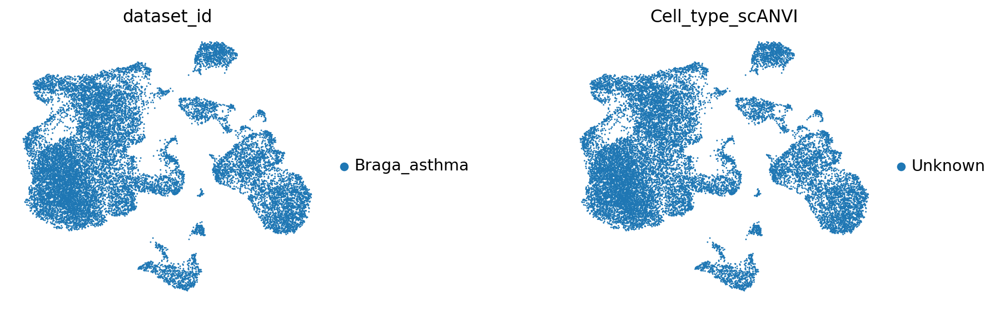

In [74]:
sc.pp.neighbors(query_latent)
sc.tl.leiden(query_latent)
sc.tl.umap(query_latent)
plt.figure()
sc.pl.umap(
    query_latent,
    color=["dataset_id", "Cell_type_scANVI"],
    frameon=False,
    wspace=0.6,
)

In [75]:
surgery_path = 'surgery_model_tissue'
model.save(surgery_path, overwrite=True)

## Latent representation of reference + query dataset and compute UMAP

In [76]:
adata_full = adata_ref.concatenate(adata_query, batch_key="ref_query")
adata_full

AnnData object with n_obs × n_vars = 383456 × 2000
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'sex', 'development_stage', 'batch', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'Cell_type_scANVI', 'disease_short', 'nhood_kth_distance', 'tissue_harmo', 'disease_short_2', 'tissue_short', 'disease_tissue', 'cell_type2', 'majority_voting_2', 'leiden_2', 'leiden_3', 'relabeled_cells_2', 'relabeled_cells_3', 'cell_source', 'n_counts', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'n_genes', 'predicted_labels', 'over_clustering', 'main_predicted_cell_groups', 'leiden', 'ref_query'
    var: 'mt-0-0', 'rb-0-0', 'n_cells_by_counts-0-0-0-0-0', 'mean_counts-0-0-0-0-0', 'pct_dropout_by_counts

In [77]:
full_latent = sc.AnnData(model.get_latent_representation(adata=adata_full))
full_latent.obs['Cell_type_scANVI'] = adata_full.obs["Cell_type_scANVI"].tolist()
full_latent.obs['donor_id'] = adata_full.obs['donor_id'].tolist()

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [78]:
full_latent.obs['dataset_id'] = adata_full.obs['dataset_id'].tolist()

<Figure size 320x320 with 0 Axes>

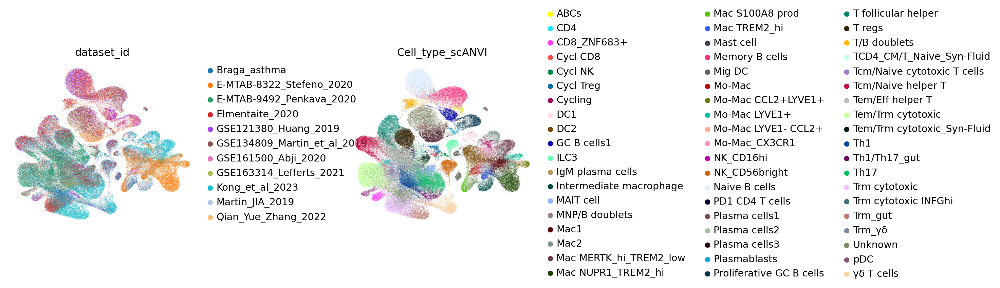

In [79]:

sc.pp.neighbors(full_latent)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)
plt.figure()
sc.pl.umap(
    full_latent,
    color=["dataset_id", "Cell_type_scANVI"],
    frameon=False,
    wspace=0.6,
)

In [80]:
full_latent.obs['predictions'] = model.predict(adata=adata_full)

<Figure size 320x320 with 0 Axes>

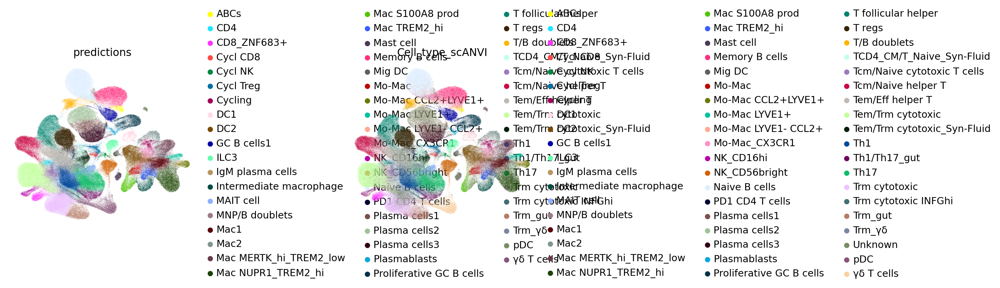

In [81]:
sc.pp.neighbors(full_latent)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)
plt.figure()
sc.pl.umap(
    full_latent,
    color=["predictions", "Cell_type_scANVI"],
    frameon=False,
    wspace=0.6,
)

In [82]:
full_latent

AnnData object with n_obs × n_vars = 383456 × 10
    obs: 'Cell_type_scANVI', 'donor_id', 'dataset_id', 'leiden', 'predictions'
    uns: 'neighbors', 'leiden', 'umap', 'dataset_id_colors', 'Cell_type_scANVI_colors', 'predictions_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [85]:
full_latent[full_latent.obs.Cell_type_scANVI != "Cell_type_scANVI"].obs["predictions"].value_counts()

Tem/Trm cytotoxic              28339
Trm cytotoxic                  25697
Naive B cells                  23227
Th17                           20589
Tem/Eff helper T               19350
Th1                            17014
T regs                         16338
Memory B cells                 13977
T follicular helper            13388
Mac NUPR1_TREM2_hi             12585
Tcm/Naive helper T             12369
DC2                            11576
Plasma cells2                  10688
Plasma cells3                  10569
γδ T cells                      8704
Mac1                            7629
Mac MERTK_hi_TREM2_low          7104
NK_CD56bright                   6751
Trm_gut                         6733
Proliferative GC B cells        6663
MAIT cell                       6151
Plasma cells1                   5798
Tcm/Naive cytotoxic T cells     5207
Mac2                            5182
GC B cells1                     4975
Th1/Th17_gut                    4621
Intermediate macrophage         4611
M

In [88]:
adata_query.obs.disease.value_counts()

Asthma    18253
Name: disease, dtype: int64

In [90]:
adata_query.obs

,dataset_id,donor_id,tissue,cell_source,disease,disease_status,age,sex,developmental_stage,sample_id,...,n_genes,predicted_labels,over_clustering,majority_voting,conf_score,main_predicted_cell_groups,leiden,_scvi_batch,_scvi_labels,Cell_type_scANVI
AAAGTAGTCTACCTGC-0,Braga_asthma,CTTV027_RNAseq7018936,lung,NaN,Asthma,NaN,NaN,NaN,NaN,AAAGTAGTCTACCTGC,...,1980,Classical monocytes,40,Classical monocytes,0.633904,Classical monocytes,13,220,56,Unknown
AAATGCCAGGCAGTCA-0,Braga_asthma,CTTV027_RNAseq7018936,lung,NaN,Asthma,NaN,NaN,NaN,NaN,AAATGCCAGGCAGTCA,...,2173,Classical monocytes,40,Classical monocytes,0.453228,Classical monocytes,13,220,56,Unknown
AACTCTTCACTCGACG-0,Braga_asthma,CTTV027_RNAseq7018936,lung,NaN,Asthma,NaN,NaN,NaN,NaN,AACTCTTCACTCGACG,...,579,Mast cells,25,Mast cells,0.992807,Mast cells,20,220,56,Unknown
AACTCTTCAGTCGATT-0,Braga_asthma,CTTV027_RNAseq7018936,lung,NaN,Asthma,NaN,NaN,NaN,NaN,AACTCTTCAGTCGATT,...,1476,CD8 T cells,128,CD4 T cells,0.081286,CD4 T cells,7,220,56,Unknown
AAGACCTTCCGTTGCT-0,Braga_asthma,CTTV027_RNAseq7018936,lung,NaN,Asthma,NaN,NaN,NaN,NaN,AAGACCTTCCGTTGCT,...,1694,Classical monocytes,40,Classical monocytes,0.785995,Classical monocytes,13,220,56,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGGATATAC-1-1-1-1-1-1-1-1-1-1-1,Braga_asthma,CTTV027_RNAseq6949177,lung,NaN,Asthma,NaN,NaN,NaN,NaN,TTTGTCAAGGATATAC,...,1291,CD8 T cells,66,CD8 T cells,0.466035,CD8 T cells,7,218,56,Unknown
TTTGTCAAGTGCCAGA-1-1-1-1-1-1-1-1-1-1-1,Braga_asthma,CTTV027_RNAseq6949177,lung,NaN,Asthma,NaN,NaN,NaN,NaN,TTTGTCAAGTGCCAGA,...,1291,Non-classical monocytes,198,Non-classical monocytes,0.987867,Non-classical monocytes,13,218,56,Unknown
TTTGTCACACCTCGTT-1-1-1-1-1-1-1-1-1-1-1,Braga_asthma,CTTV027_RNAseq6949177,lung,NaN,Asthma,NaN,NaN,NaN,NaN,TTTGTCACACCTCGTT,...,1274,Classical monocytes,40,Classical monocytes,0.598630,Classical monocytes,13,218,56,Unknown
TTTGTCACAGGACCCT-1-1-1-1-1-1-1-1-1-1-1,Braga_asthma,CTTV027_RNAseq6949177,lung,NaN,Asthma,NaN,NaN,NaN,NaN,TTTGTCACAGGACCCT,...,772,CD8 T cells,1,CD8 T cells,0.696028,CD8 T cells,10,218,56,Unknown


In [101]:
adata_full.obs.disease_tissue.value_counts()

Paed_IBD_colon                  23299
hashimoto_thyroid               20035
Paed_IBD_ileum                  10720
CD_ileum                         9474
Uninfl_CD_ileum                  7345
Paed_Healthy_ileum               7334
CD_spondyloarthritis_colon        932
Healthy_colon                     818
CD_colon                          778
Resitant_treat_RA_syno_membr      691
spondyloarhtriti_colon            553
Remission_RA_syno_membr           232
Naïve_treat_RA_syno_membr         123
Name: disease_tissue, dtype: int64

In [153]:
#correct disease

sample = {"CTTV027_RNAseq6949177":"Healthy", 
          "CTTV027_RNAseq7487979":"Asthma", 
          "CTTV027_RNAseq7333559":"Asthma", 
          "4951STDY7487591":"Healthy",
          "CTTV027_RNAseq7118946":"Healthy", 
          "CTTV027_RNAseq7333558":"Asthma", 
          "CTTV027_RNAseq6949176":"Healthy", 
          "CTTV027_RNAseq7118945":"Healthy", 
          "CTTV027_RNAseq7333557":"Healthy", 
          "CTTV027_RNAseq6949175":"Asthma", 
          "CTTV027_RNAseq7018935":"Asthma", 
          "CTTV027_RNAseq7018936":"Asthma"}

In [154]:
adata_ref.obs.disease_tissue.value_counts()

Paed_IBD_colon                  23299
hashimoto_thyroid               20035
Paed_IBD_ileum                  10720
CD_ileum                         9474
Uninfl_CD_ileum                  7345
Paed_Healthy_ileum               7334
CD_spondyloarthritis_colon        932
Healthy_colon                     818
CD_colon                          778
Resitant_treat_RA_syno_membr      691
spondyloarhtriti_colon            553
Remission_RA_syno_membr           232
Naïve_treat_RA_syno_membr         123
Name: disease_tissue, dtype: int64

In [100]:
adata_query.obs["tissue_harmo"] = "Lung"

In [155]:
adata_query.obs['disease'] = adata_query.obs.donor_id

In [156]:
adata_query.obs['disease'] = (
    adata_query.obs["disease"]
    .map(lambda x: sample.get(x, x))
    .astype("category")
)

In [157]:
adata_query.obs['disease'].value_counts()

Healthy    10114
Asthma      8139
Name: disease, dtype: int64

In [158]:
adata_query

AnnData object with n_obs × n_vars = 18253 × 2000
    obs: 'dataset_id', 'donor_id', 'tissue', 'cell_source', 'disease', 'disease_status', 'age', 'sex', 'developmental_stage', 'sample_id', 'n_counts', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'n_genes', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'main_predicted_cell_groups', 'leiden', '_scvi_batch', '_scvi_labels', 'Cell_type_scANVI', 'tissue_harmo', 'disease_tissue'
    var: 'n_counts', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'leiden', 'leiden_sizes', 'log1p', 'main_predicted_cell_groups_colors', 'majority_voting_colors', 'neighbors', 'paga', 'pca', 'umap', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [159]:
adata_ref

AnnData object with n_obs × n_vars = 365203 × 2000
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'sex', 'development_stage', 'batch', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'Cell_type_scANVI', 'disease_short', 'nhood_kth_distance', 'tissue_harmo', 'disease_short_2', 'tissue_short', 'disease_tissue', 'cell_type2', 'majority_voting_2', 'leiden_2', 'leiden_3', 'relabeled_cells_2', 'relabeled_cells_3'
    var: 'mt-0', 'rb-0', 'n_cells_by_counts-0-0-0-0', 'mean_counts-0-0-0-0', 'pct_dropout_by_counts-0-0-0-0', 'total_counts-0-0-0-0', 'n_cells_by_counts-1-0-0-0', 'mean_counts-1-0-0-0', 'pct_dropout_by_counts-1-0-0-0', 'total_counts-1-0-0-0', 'n_cells_by_counts-1-0-0', 'mean_counts-1-0-0', 'pct_dropout_by_counts-1-0-0', 'total_counts-1-0-0', 'gene_symbol-1-0-0-0-0-0-0-1-1-0', 'n_cells_by_c

In [160]:
adata_full = adata_ref.concatenate(adata_query, batch_key="ref_query")
adata_full

AnnData object with n_obs × n_vars = 383456 × 2000
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'sex', 'development_stage', 'batch', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'Cell_type_scANVI', 'disease_short', 'nhood_kth_distance', 'tissue_harmo', 'disease_short_2', 'tissue_short', 'disease_tissue', 'cell_type2', 'majority_voting_2', 'leiden_2', 'leiden_3', 'relabeled_cells_2', 'relabeled_cells_3', 'cell_source', 'n_counts', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'n_genes', 'predicted_labels', 'over_clustering', 'main_predicted_cell_groups', 'leiden', 'ref_query'
    var: 'mt-0-0', 'rb-0-0', 'n_cells_by_counts-0-0-0-0-0', 'mean_counts-0-0-0-0-0', 'pct_dropout_by_counts

In [161]:
adata_full.obs["disease_label_trans"] = adata_full.obs.disease.astype("str") + "_" + adata_full.obs.tissue_harmo.astype("str")

In [162]:
adata_full.obs['disease_label_trans'].value_counts(dropna = False)

Uninflam_CD_Ileum                               74829
Psoriatic arthritis_Synovial fluid              40392
Paediatric IBD_Colon                            37406
Crohn's Disease_Ileum                           35742
Hashimoto’s thyroiditis_Thyroid                 33413
Rheumatoid Arthritis_Synovial membrane          29631
Paediatric IBD_Ileum                            20097
Oligoarticular JIA_Synovial fluid               18862
Uninflam_CD_Colon                               14000
Healthy_Colon                                   13835
Paed_Healthy_Ileum                              13266
Healthy_Lung                                    10114
Crohn's Disease_Colon                            9917
Asthma_Lung                                      8139
Undifferentiated Arthritis_Synovial membrane     6910
Healthy_Ileum                                    6837
Healthy_Synovial membrane                        5032
Spondyloarhtritis_Colon                          2445
CD + Spondyloarthritis_Colon

In [163]:
adata_full.obs['disease'].value_counts(dropna = False)

Uninflam_CD                   88829
Paediatric IBD                57503
Crohn's Disease               45659
Psoriatic arthritis           41043
Healthy                       35818
Hashimoto’s thyroiditis       33413
Rheumatoid Arthritis          29631
Oligoarticular JIA            18862
Paed_Healthy                  13266
Asthma                         8139
Undifferentiated Arthritis     6910
Spondyloarhtritis              2445
CD + Spondyloarthritis         1938
Name: disease, dtype: int64

In [165]:
adata_full.obs['predictions'] = model.predict(adata=adata_full)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [166]:
adata_full.obs[['disease_label_trans', 'predictions']].value_counts()

disease_label_trans                 predictions      
Uninflam_CD_Ileum                   Trm cytotoxic        10577
Paediatric IBD_Colon                Naive B cells        10512
Psoriatic arthritis_Synovial fluid  Tem/Trm cytotoxic    10320
                                    Tem/Eff helper T      8840
Uninflam_CD_Ileum                   Th17                  8578
                                                         ...  
CD + Spondyloarthritis_Colon        ILC3                     1
Paediatric IBD_Ileum                DC1                      1
Oligoarticular JIA_Synovial fluid   Trm_gut                  1
Paediatric IBD_Ileum                Trm_gut                  1
                                    Mig DC                   1
Length: 885, dtype: int64

In [167]:
adata_full.obs.dataset_id.value_counts()

Kong_et_al_2023                101054
GSE134809_Martin_et_al_2019     47390
E-MTAB-8322_Stefeno_2020        41573
E-MTAB-9492_Penkava_2020        38906
GSE121380_Huang_2019            37406
Elmentaite_2020                 34902
Qian_Yue_Zhang_2022             33413
Martin_JIA_2019                 18862
Braga_asthma                    18253
GSE163314_Lefferts_2021          9560
GSE161500_Abji_2020              2137
Name: dataset_id, dtype: int64

In [168]:
adata_full.obs.Cell_type_scANVI.value_counts()

Tem/Trm cytotoxic              25831
Trm cytotoxic                  24807
Naive B cells                  21693
Th17                           19936
Tem/Eff helper T               19195
Unknown                        18253
T regs                         15089
Memory B cells                 14690
Th1                            14476
Tcm/Naive helper T             13136
T follicular helper            13106
Mac NUPR1_TREM2_hi             13065
DC2                            10791
Plasma cells1                   9885
Plasma cells2                   9014
γδ T cells                      8625
Mac1                            7422
Plasma cells3                   6881
Mac MERTK_hi_TREM2_low          6789
NK_CD56bright                   6394
Proliferative GC B cells        6391
Trm_gut                         5944
MAIT cell                       5659
GC B cells1                     5140
Mac2                            4848
Trm_γδ                          4631
Tcm/Naive cytotoxic T cells     4539
T

In [178]:
pd.DataFrame(adata_full.obs).to_csv("Obs_Myeloid_B_T_From_PBMC_label_transfert_Subset_annotated_Milo_3K_with_UMAP_from_gpu.csv")

In [16]:
adata_query = sc.read_h5ad("Braga_asthma_lung_celltypist.h5ad")

In [17]:
adata_query = adata_query[adata_query.obs.main_predicted_cell_groups.isin(['Classical monocytes', 'Mast cells', 'CD4 T cells', 
                                                           'DC2', 'CD8 T cells', 'Non-classical monocytes', 'NK cells', 
                                                           'B cells', 'Alveolar macrophages', 'Plasmacytoid DCs', 'Plasma cells'])].copy()

In [18]:
adata = adata.concatenate(adata_query, batch_key="ref_query")

/var/tmp/ipykernel_487698/296564144.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = adata.concatenate(adata_query, batch_key="ref_query")


In [19]:
adata.obs = obs.copy()

In [20]:
del obs
del adata_query
gc.collect()

653

In [64]:
adata.obs['batch'].value_counts()

2.0    209036
0.0     82334
1.0     73833
Name: batch, dtype: int64

In [65]:
adata.obs["predictions"].value_counts()

Tem/Trm cytotoxic              28339
Trm cytotoxic                  25697
Naive B cells                  23227
Th17                           20589
Tem/Eff helper T               19350
Th1                            17014
T regs                         16338
Memory B cells                 13977
T follicular helper            13388
Mac NUPR1_TREM2_hi             12585
Tcm/Naive helper T             12369
DC2                            11576
Plasma cells2                  10688
Plasma cells3                  10569
γδ T cells                      8704
Mac1                            7629
Mac MERTK_hi_TREM2_low          7104
NK_CD56bright                   6751
Trm_gut                         6733
Proliferative GC B cells        6663
MAIT cell                       6151
Plasma cells1                   5798
Tcm/Naive cytotoxic T cells     5207
Mac2                            5182
GC B cells1                     4975
Th1/Th17_gut                    4621
Intermediate macrophage         4611
M

### Myeloid

In [25]:
adata_myeloid = adata[adata.obs.predictions.isin(['Mac NUPR1_TREM2_hi', 'DC2', 'Mac1', 'Mac MERTK_hi_TREM2_low',
                                                                      'Mac2', 'Intermediate macrophage', 'Mac S100A8 prod', 'Mo-Mac_CX3CR1', 
                                                                      'Mac TREM2_hi', 'Mo-Mac', 'Mo-Mac CCL2+LYVE1+', 'Mo-Mac LYVE1+', 'Mast cell', 'Mig DC',
                                                                      'Mo-Mac LYVE1- CCL2+', 'pDC'])].copy()

/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/opt/conda/envs/autoimmune/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/opt/conda/envs

Epoch 110/110: 100%|██████████| 110/110 [10:21<00:00,  5.59s/it, v_num=1, train_loss_step=816, train_loss_epoch=723]

`Trainer.fit` stopped: `max_epochs=110` reached.


Epoch 110/110: 100%|██████████| 110/110 [10:21<00:00,  5.65s/it, v_num=1, train_loss_step=816, train_loss_epoch=723]
KNN, UMAP, clustering ...
Plot UMAP of with highly variable genes...


/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


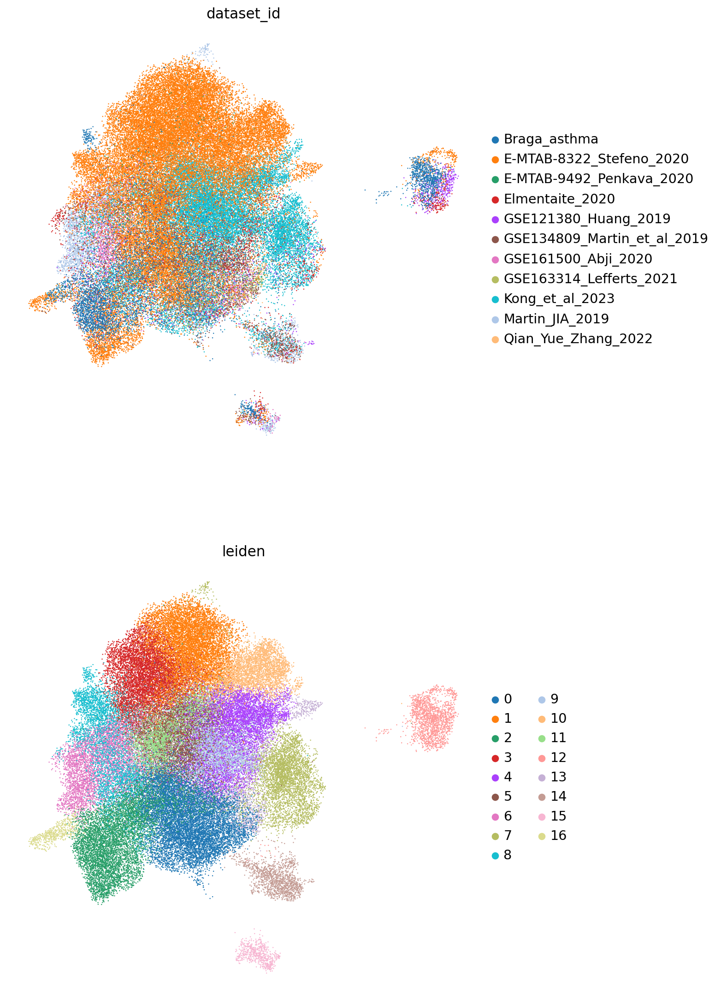

Plot UMAP of the full adata...


/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


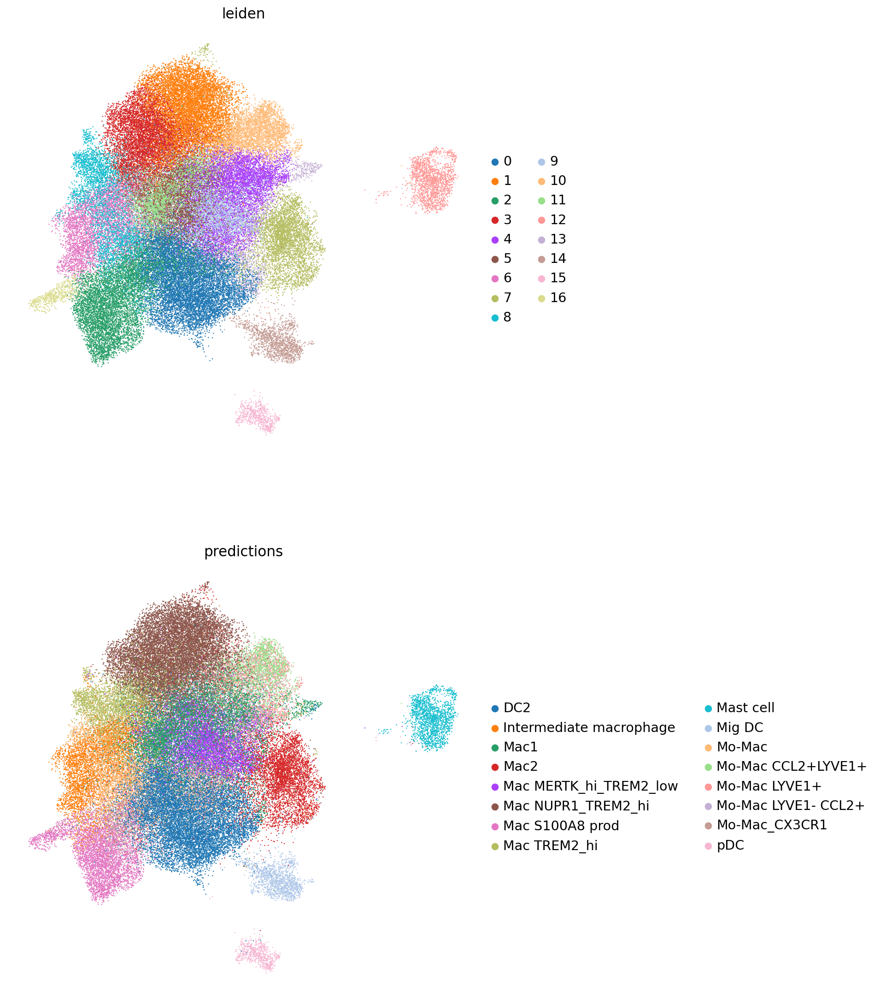

In [26]:
adata_myeloid = reintegrate_subset(adata=adata_myeloid, n_hgv=2000, n_layers=3)

In [27]:
adata_myeloid.obs['Cell_type_scANVI2'] = adata_myeloid.obs.predictions

<Axes: xlabel='Cell_type_scANVI', ylabel='Cell_type_scANVI2'>

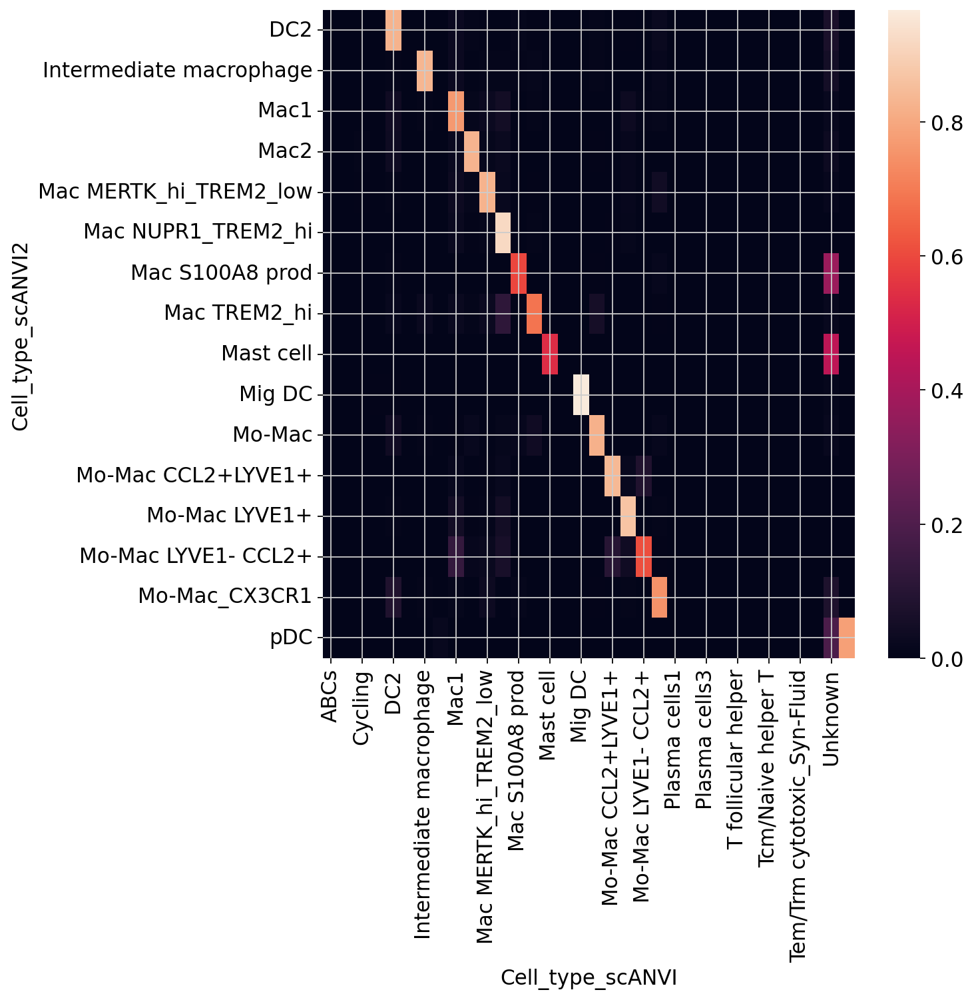

In [28]:
cmtx = sc.metrics.confusion_matrix("Cell_type_scANVI2", "Cell_type_scANVI", adata_myeloid.obs)
sns.heatmap(cmtx)

/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


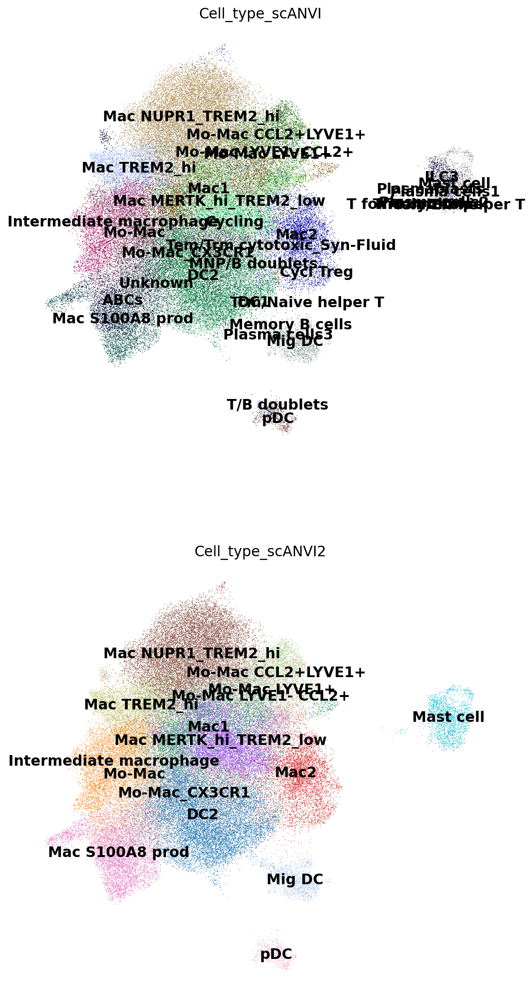

In [29]:
sc.pl.umap(
    adata_myeloid,
    color=['Cell_type_scANVI', 'Cell_type_scANVI2'],
    frameon=False,
    size=2,
    ncols=1,
    use_raw=True,
    legend_loc="on data"
)

In [30]:
adata_myeloid.obs = adata_myeloid.obs[['tissue', 'disease', 'donor_id', 'dataset_id', 'sex',
       'development_stage', 'batch', 'majority_voting', 'conf_score',
       '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes',
       'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id',
       'Site', 'Enrichment', 'Location', 'full_clustering',
       'log1p_total_counts', 'Cell_type_scANVI', 'disease_short',
       'nhood_kth_distance', 'tissue_harmo', 'disease_short_2', 'tissue_short',
       'disease_tissue', 'cell_type2', 'majority_voting_2', 'leiden_2',
       'leiden_3', 'relabeled_cells_2', 'relabeled_cells_3', 'cell_source',
       'n_counts', 'doublet_scores', 'predicted_labels', 'over_clustering',
       'main_predicted_cell_groups', 'leiden', 'ref_query',
       'disease_label_trans', 'predictions', 'Cell_type_scANVI2']]

In [31]:
adata_myeloid.write_h5ad("result_scvi/Myeloid_B_T_From_Tissue/scVI_after_label_trans/Myeloid_From_Tissue_Subset_with_asthma.h5ad")

In [32]:
del adata_myeloid
gc.collect()

84617

### T cell

In [21]:
adata.obs["predictions"].value_counts()

Tem/Trm cytotoxic              28339
Trm cytotoxic                  25697
Naive B cells                  23227
Th17                           20589
Tem/Eff helper T               19350
Th1                            17014
T regs                         16338
Memory B cells                 13977
T follicular helper            13388
Mac NUPR1_TREM2_hi             12585
Tcm/Naive helper T             12369
DC2                            11576
Plasma cells2                  10688
Plasma cells3                  10569
γδ T cells                      8704
Mac1                            7629
Mac MERTK_hi_TREM2_low          7104
NK_CD56bright                   6751
Trm_gut                         6733
Proliferative GC B cells        6663
MAIT cell                       6151
Plasma cells1                   5798
Tcm/Naive cytotoxic T cells     5207
Mac2                            5182
GC B cells1                     4975
Th1/Th17_gut                    4621
Intermediate macrophage         4611
M

In [22]:
adata_t_cell = adata[adata.obs.predictions.isin(['Tem/Trm cytotoxic', 'Trm cytotoxic', 'Th17', 'Th1',
                                                 'Tem/Eff helper T', 'T regs', 'T follicular helper', 'Tcm/Naive helper T', 
                                                 'γδ T cells', 'NK_CD56bright', 'Trm_gut', 'MAIT cell', 'Tcm/Naive cytotoxic T cells', 'Th1/Th17_gut',
                                                 'Trm_γδ', 'Tem/Trm cytotoxic_Syn-Fluid', 'ILC3', 'CD8_ZNF683+', 'Cycl Treg', 'TCD4_CM/T_Naive_Syn-Fluid',
                                                 'Trm cytotoxic INFGhi', 'PD1 CD4 T cells', 'NK_CD16hi', 'CD4', 'Cycl CD8', 'Cycl NK'
                                                ])].copy()

In [ ]:
adata_t_cell = reintegrate_subset(adata=adata_t_cell, n_hgv=2000, n_layers=3)

/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/opt/conda/envs/autoimmune/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
/opt/conda/envs

Epoch 36/36: 100%|██████████| 36/36 [09:17<00:00, 15.41s/it, v_num=1, train_loss_step=688, train_loss_epoch=701]

`Trainer.fit` stopped: `max_epochs=36` reached.


Epoch 36/36: 100%|██████████| 36/36 [09:17<00:00, 15.47s/it, v_num=1, train_loss_step=688, train_loss_epoch=701]
KNN, UMAP, clustering ...


In [ ]:
adata_t_cell.obs['Cell_type_scANVI2'] = adata_t_cell.obs.predictions

In [ ]:
cmtx = sc.metrics.confusion_matrix("Cell_type_scANVI2", "Cell_type_scANVI", adata_t_cell.obs)
sns.heatmap(cmtx)

In [ ]:
sc.pl.umap(
    adata_t_cell,
    color=['Cell_type_scANVI', 'Cell_type_scANVI2'],
    frameon=False,
    size=2,
    ncols=1,
    use_raw=True,
    legend_loc="on data"
)

In [ ]:
adata_t_cell.obs = adata_t_cell.obs[['tissue', 'disease', 'donor_id', 'dataset_id', 'sex',
       'development_stage', 'batch', 'majority_voting', 'conf_score',
       '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes',
       'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id',
       'Site', 'Enrichment', 'Location', 'full_clustering',
       'log1p_total_counts', 'Cell_type_scANVI', 'disease_short',
       'nhood_kth_distance', 'tissue_harmo', 'disease_short_2', 'tissue_short',
       'disease_tissue', 'cell_type2', 'majority_voting_2', 'leiden_2',
       'leiden_3', 'relabeled_cells_2', 'relabeled_cells_3', 'cell_source',
       'n_counts', 'doublet_scores', 'predicted_labels', 'over_clustering',
       'main_predicted_cell_groups', 'leiden', 'ref_query',
       'disease_label_trans', 'predictions', 'Cell_type_scANVI2']]

In [ ]:
adata_t_cell.write_h5ad("result_scvi/Myeloid_B_T_From_Tissue/scVI_after_label_trans/T_cells_From_Tissue_Subset_with_asthma.h5ad")

In [32]:
del adata_t_cell
gc.collect()

84617

### B cell

In [21]:
adata.obs["predictions"].value_counts()

Tem/Trm cytotoxic              28339
Trm cytotoxic                  25697
Naive B cells                  23227
Th17                           20589
Tem/Eff helper T               19350
Th1                            17014
T regs                         16338
Memory B cells                 13977
T follicular helper            13388
Mac NUPR1_TREM2_hi             12585
Tcm/Naive helper T             12369
DC2                            11576
Plasma cells2                  10688
Plasma cells3                  10569
γδ T cells                      8704
Mac1                            7629
Mac MERTK_hi_TREM2_low          7104
NK_CD56bright                   6751
Trm_gut                         6733
Proliferative GC B cells        6663
MAIT cell                       6151
Plasma cells1                   5798
Tcm/Naive cytotoxic T cells     5207
Mac2                            5182
GC B cells1                     4975
Th1/Th17_gut                    4621
Intermediate macrophage         4611
M

In [22]:
adata_b_cell = adata[adata.obs.predictions.isin(['Naive B cells', 'Memory B cells', 'Plasma cells2', 'Plasma cells3', 'Proliferative GC B cells',
                                                                      'Plasma cells1', 'GC B cells1', 'T/B doublets', 'ABCs', 
                                                                      'Plasmablasts', 'MNP/B doublets', 'IgM plasma cells'])].copy()

In [28]:
adata_b_cell.obs.dataset_id.value_counts()

GSE121380_Huang_2019           23291
Qian_Yue_Zhang_2022            20013
Elmentaite_2020                17994
GSE134809_Martin_et_al_2019    16761
GSE163314_Lefferts_2021         3076
Braga_asthma                    1359
E-MTAB-8322_Stefeno_2020        1042
Kong_et_al_2023                   11
Martin_JIA_2019                    1
Name: dataset_id, dtype: int64

In [30]:
adata_b_cell = adata_b_cell[adata_b_cell.obs.dataset_id != "Martin_JIA_2019"]


In [ ]:
adata_b_cell = reintegrate_subset(adata=adata_b_cell, n_hgv=2000, n_layers=3)

/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/opt/conda/envs/autoimmune/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/opt/conda/envs/autoimmune/lib/python3.9/site-packages/scvi/data/fields/_dataframe_field.py:183: UserWarning: Category 32 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categ

Epoch 72/96:  74%|███████▍  | 71/96 [06:55<02:29,  5.98s/it, v_num=1, train_loss_step=655, train_loss_epoch=653]

In [ ]:
adata_b_cell.obs['Cell_type_scANVI2'] = adata_b_cell.obs.predictions

In [ ]:
cmtx = sc.metrics.confusion_matrix("Cell_type_scANVI2", "Cell_type_scANVI", adata_b_cell.obs)
sns.heatmap(cmtx)

In [ ]:
sc.pl.umap(
    adata_b_cell,
    color=['Cell_type_scANVI', 'Cell_type_scANVI2'],
    frameon=False,
    size=2,
    ncols=1,
    use_raw=True,
    legend_loc="on data"
)

In [ ]:
adata_b_cell.obs = adata_b_cell.obs[['tissue', 'disease', 'donor_id', 'dataset_id', 'sex',
       'development_stage', 'batch', 'majority_voting', 'conf_score',
       '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes',
       'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id',
       'Site', 'Enrichment', 'Location', 'full_clustering',
       'log1p_total_counts', 'Cell_type_scANVI', 'disease_short',
       'nhood_kth_distance', 'tissue_harmo', 'disease_short_2', 'tissue_short',
       'disease_tissue', 'cell_type2', 'majority_voting_2', 'leiden_2',
       'leiden_3', 'relabeled_cells_2', 'relabeled_cells_3', 'cell_source',
       'n_counts', 'doublet_scores', 'predicted_labels', 'over_clustering',
       'main_predicted_cell_groups', 'leiden', 'ref_query',
       'disease_label_trans', 'predictions', 'Cell_type_scANVI2']]

In [ ]:
adata_b_cell.write_h5ad("result_scvi/Myeloid_B_T_From_Tissue/scVI_after_label_trans/B_cells_From_Tissue_Subset_with_asthma.h5ad")

### Save 

In [45]:
def save_x_scvi(adata,data_dir, file_name, vae):
    """
    data_dir path to save scvi embedding
    file_name name for example Immune_compartment_PBMC
    """
   # x_scanvi = vae.get_latent_representation(adata)
    outname = "{fname}.scVI_out.npy".format(fname=file_name)
    #modelname = "{fname}_scvi_model".format(fname=file_name)
    #np.save(data_dir + outname, x_scanvi)
    #vae.save(data_dir + modelname, overwrite=True)
    #pd.DataFrame(adata.obs).to_csv(data_dir+outname+".obs.csv")
    np.save(data_dir + file_name+".UMAP.npy", adata.obsm["X_umap"])
    
    #umap and obs as df
    
    umap = adata.obsm["X_umap"]
    
    umap = pd.DataFrame(umap, columns=["umap1", "umap2"])
    obs = adata.obs
    umap.index = obs.index
    obs["umap1"] = umap.umap1
    obs["umap2"] = umap.umap2
    obs.to_csv("Obs_umap_" + file_name + "scVI_from_gpu.csv")

In [ ]:
adata = sc.read_h5ad('Myeloid_B_T_From_Tissue_label_transfert_Subset_annotated_Milo_3K.h5ad')

In [46]:
 save_x_scvi(adata=adata, data_dir="result_scvi/Myeloid_B_T_From_Tissue/", file_name="scVI_Myeloid_B_T_From_Tissue", vae=vae)

In [47]:
umap = adata.obsm["X_umap"]

In [48]:
umap = pd.DataFrame(umap, columns=["umap1", "umap2"])

In [49]:
umap

,umap1,umap2
0,0.122970,13.952169
1,0.282985,8.415564
2,-0.288593,8.597524
3,-0.630980,14.753313
4,1.085140,7.814439
...,...,...
365198,1.350270,-0.496049
365199,1.450526,-2.180768
365200,0.323231,0.026419
365201,0.572630,-0.601193


In [50]:
obs = adata.obs

In [51]:
umap.index = obs.index

In [52]:
obs["umap1"] = umap.umap1

obs["umap2"] = umap.umap2

In [53]:
obs.umap1

AAACCTGGTAGCACGA-1-1_0_0-0-0                  0.122970
AAACCTGGTCCGAGTC-1_0_0-0-0                    0.282985
AAACCTGTCAGTTAGC-1_0_0-0-0                   -0.288593
AAAGATGTCCTAAGTG-1-1_0_0-0-0                 -0.630980
AAAGCAATCTACGAGT-1_0_0-0-0                    1.085140
                                                ...   
TTTACTGTCATGGTCA-1-1-1-1-1-1-1_1_0_0-1-1-2    1.350270
TTTGCGCCATGCCCGA-1-1-1-1-1-1-1_1_0_0-1-1-2    1.450526
TTTGCGCGTAAACACA-1-1-1-1-1-1-1_1_0_0-1-1-2    0.323231
TTTGGTTCAATCCGAT-1-1-1-1-1-1-1_1_0_0-1-1-2    0.572630
TTTGTCAGTGATGCCC-1-1-1-1-1-1-1_1_0_0-1-1-2    0.803131
Name: umap1, Length: 365203, dtype: float32

In [54]:
obs.to_csv("Obs_Myeloid_B_T_From_PBMC_label_transfert_Subset_annotated_Milo_3K_with_UMAP_from_gpu.csv")

In [55]:
obs

,tissue,disease,donor_id,dataset_id,sex,development_stage,batch,majority_voting,conf_score,_scvi_batch,...,disease_tissue,cell_type2,majority_voting_2,leiden_2,leiden_3,relabeled_cells_2,relabeled_cells_3,leiden,umap1,umap2
AAACCTGGTAGCACGA-1-1_0_0-0-0,Thyroid,Hashimoto’s thyroiditis,HT12Thyroid,Qian_Yue_Zhang_2022,NaN,NaN,0,Plasma cells,0.947648,49,...,hashimoto_thyroid,NaN,NaN,NaN,NaN,NaN,NaN,6,0.122970,13.952169
AAACCTGGTCCGAGTC-1_0_0-0-0,Thyroid,Hashimoto’s thyroiditis,HT12Thyroid,Qian_Yue_Zhang_2022,NaN,NaN,0,Naive B cells,0.963530,49,...,hashimoto_thyroid,NaN,NaN,NaN,NaN,NaN,NaN,2,0.282985,8.415564
AAACCTGTCAGTTAGC-1_0_0-0-0,Thyroid,Hashimoto’s thyroiditis,HT12Thyroid,Qian_Yue_Zhang_2022,NaN,NaN,0,Naive B cells,0.912090,49,...,hashimoto_thyroid,NaN,NaN,NaN,NaN,NaN,NaN,2,-0.288593,8.597524
AAAGATGTCCTAAGTG-1-1_0_0-0-0,Thyroid,Hashimoto’s thyroiditis,HT12Thyroid,Qian_Yue_Zhang_2022,NaN,NaN,0,Plasma cells,0.989998,49,...,hashimoto_thyroid,NaN,NaN,NaN,NaN,NaN,NaN,6,-0.630980,14.753313
AAAGCAATCTACGAGT-1_0_0-0-0,Thyroid,Hashimoto’s thyroiditis,HT12Thyroid,Qian_Yue_Zhang_2022,NaN,NaN,0,Naive B cells,0.775685,49,...,hashimoto_thyroid,NaN,NaN,NaN,NaN,NaN,NaN,2,1.085140,7.814439
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTACTGTCATGGTCA-1-1-1-1-1-1-1_1_0_0-1-1-2,Retrosigmoid Colon,CD + Spondyloarthritis,Patient_2_Colon_GSM4976992,GSE163314_Lefferts_2021,NaN,NaN,2,Type 1 helper T cells,0.422139,169,...,NaN,7,B_plasma_IgA,5,5,Th1,Th1,0,1.350270,-0.496049
TTTGCGCCATGCCCGA-1-1-1-1-1-1-1_1_0_0-1-1-2,Retrosigmoid Colon,CD + Spondyloarthritis,Patient_2_Colon_GSM4976992,GSE163314_Lefferts_2021,NaN,NaN,2,Type 1 helper T cells,0.398410,169,...,NaN,7,B_plasma_IgA,5,5,Th1,Th1,0,1.450526,-2.180768
TTTGCGCGTAAACACA-1-1-1-1-1-1-1_1_0_0-1-1-2,Retrosigmoid Colon,CD + Spondyloarthritis,Patient_2_Colon_GSM4976992,GSE163314_Lefferts_2021,NaN,NaN,2,Type 1 helper T cells,0.421337,169,...,NaN,7,B_plasma_IgA,7,6,Th17,Th17,0,0.323231,0.026419
TTTGGTTCAATCCGAT-1-1-1-1-1-1-1_1_0_0-1-1-2,Retrosigmoid Colon,CD + Spondyloarthritis,Patient_2_Colon_GSM4976992,GSE163314_Lefferts_2021,NaN,NaN,2,Type 1 helper T cells,0.121884,169,...,NaN,"6,0",B_plasma_IgA,3,5,T follicular helper,T follicular helper,0,0.572630,-0.601193


In [11]:
!rclone copy ../data/ 'gdrive:Projects/gcp_gpu/data_gpu/'

In [10]:
!pwd

/home/jupyter/data
